# Детекция объектов

Сыграем в квиддич?

In [ ]:
#Harry Potter -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip


!unzip -q data.zip

--2023-12-06 18:42:38--  https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip [following]
--2023-12-06 18:42:39--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17592727 (17M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  16.78M  --.-KB/s    in 0.09s   

2023-12-06 18:42:39 (190 MB/s) - ‘data.zip’ saved [17592727/17592727]



In [ ]:
import torch
from xml.etree import ElementTree as ET
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from pathlib import Path
import glob
import numpy as np
from PIL import Image
import torchvision
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from torch import nn
import shutil
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

In [ ]:
import random
import os
def seed_everything(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [ ]:
seed_everything(42)

In [ ]:
def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    filename = image_name.split("/")[-1].split(".")[0]
    # read xml
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()
    # iterate over bboxes
    bboxes = []
    for member in treeroot.findall("object"):
       class_name = member.find("name").text
       if class_name in class_dict:
          bbox = member.find("bndbox")
          xmin = int(bbox.find("xmin").text)
          ymin = int(bbox.find("ymin").text)
          xmax = int(bbox.find("xmax").text)
          ymax = int(bbox.find("ymax").text)
          res = [xmin, ymin, xmax, ymax, class_dict[class_name]]
       bboxes.append(res)

    return bboxes

In [ ]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform
        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "/images/*"))
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        image = np.array(Image.open(fname).convert("RGB"))
        bboxes = get_xml_data(fname, self.root, self.class_dict)
        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [ ]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [ ]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)

In [ ]:
import matplotlib.patches as patches

def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):

        ax.axis(False)

        if i >= len(images):
            break
        image = images[i].permute(1, 2, 0)
        image = image * torch.tensor(std) + torch.tensor(mean)
        class_dict_inv = train_ds.class_dict_inv
        ax.imshow(image)

        for bbox in bboxes[i]:
          xmin, ymin, xmax, ymax = bbox[0], bbox[1], bbox[2], bbox[3]
          width = xmax - xmin
          height = ymax - ymin

          rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='r', facecolor='none')
          ax.add_patch(rect)
          ax.text(xmin, ymin - 5, class_dict_inv[bbox[4]], color='r')

    fig.tight_layout()
    plt.show()

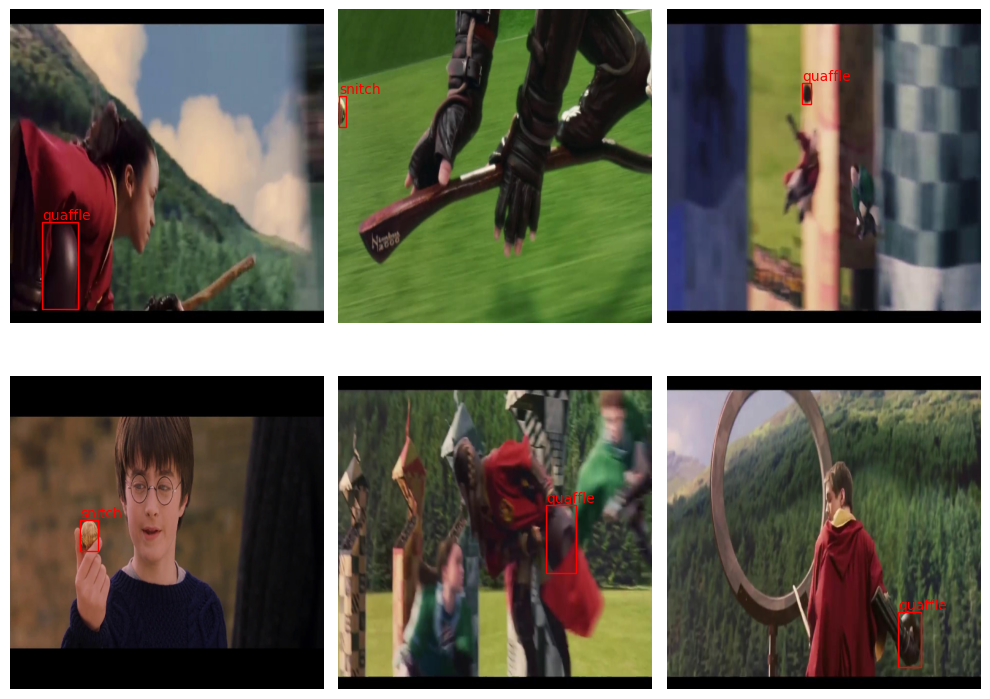

In [ ]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

In [ ]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample)

    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )
        x_cell = w / downsample
        y_cell = h / downsample
        w_box = (xmax - xmin) / w
        h_box = (ymax - ymin) / h

        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2
        cx_idx = (cx//downsample).to(dtype=torch.int)
        cy_idx = (cy//downsample).to(dtype=torch.int)

        cx_box = (cx - (cx_idx * downsample))/downsample
        cy_box = (cy - (cy_idx * downsample))/downsample

        target[i, :, cy_idx, cx_idx] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}

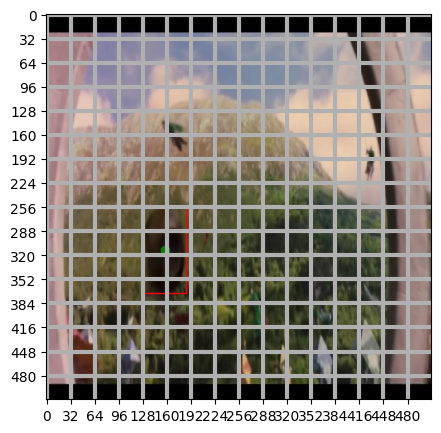

In [ ]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

In [ ]:
def decode_prediction(pred, upsample=32, threshold=0.7):
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample

    bboxes = []
    for batch_idx in range(b):
        batch_predictions = []
        for cy in range(h):
            for cx in range(w):
                center_x = cx * upsample + pred[batch_idx, 0, cy, cx] * upsample
                center_y = cy * upsample + pred[batch_idx, 1, cy, cx] * upsample

                width = pred[batch_idx, 2, cy, cx] * img_w
                height = pred[batch_idx, 3, cy, cx] * img_h

                confidence = pred[batch_idx, 4, cy, cx]

                if c == 6:
                    class_id = int(pred[batch_idx, 5, cy, cx])
                else:
                    class_id = int(pred[batch_idx, 5:, cy, cx].argmax())

                if confidence > threshold:
                    xmin = max(0, int(center_x - width / 2))
                    ymin = max(0, int(center_y - height / 2))
                    xmax = min(img_w, int(center_x + width / 2))
                    ymax = min(img_h, int(center_y + height / 2))
                    batch_predictions.append([xmin, ymin, xmax, ymax, class_id])
        bboxes.append(batch_predictions)

    return bboxes


In [ ]:
C =  3


class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        self.resnet_layers = nn.Sequential(
            model.conv1,
            model.bn1,
            model.relu,
            model.maxpool,
            model.layer1,
            model.layer2,
            model.layer3,
            model.layer4
        )
        self.conv_layers = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 5 + C, kernel_size=3, padding=1)
        )


    def forward(self, img):
        embeddings = self.resnet_layers(img)
        detection_map = self.conv_layers(embeddings)
        detection_map = torch.sigmoid(detection_map)
        return detection_map

In [ ]:
import torch.nn.functional as F

def special_loss(pred, target, check=False, C=3):
    target_obj = target[:, 4, :, :] == 1
    target_no_obj = ~target_obj
    localization_loss = F.mse_loss(pred[:, :2, :, :].masked_select(target_obj.unsqueeze(1)),
                                   target[:, :2, :, :].masked_select(target_obj.unsqueeze(1)), reduction='sum')

    box_loss = F.mse_loss(torch.sqrt(pred[:, 2:4, :, :].masked_select(target_obj.unsqueeze(1))),
                          torch.sqrt(target[:, 2:4, :, :].masked_select(target_obj.unsqueeze(1))), reduction='sum')



    classification_loss = F.cross_entropy(torch.masked_select(pred[:, 5:, :, :], target_obj.unsqueeze(1)).view(-1, C),target[:, 5, :, :].masked_select(target_obj).long(), reduction='sum')


    confidence_loss_obj = F.binary_cross_entropy(pred[:, 4, :, :].masked_select(target_obj), target[:, 4, :, :].masked_select(target_obj), reduction='sum')
    confidence_loss_no_obj =F.binary_cross_entropy(pred[:, 4, :, :].masked_select(target_no_obj), target[:, 4, :, :].masked_select(target_no_obj), reduction='sum')

    confidence_loss = confidence_loss_obj + confidence_loss_no_obj*0.1

    if not check:
        return  localization_loss + box_loss + classification_loss + confidence_loss

    else:
        return localization_loss, box_loss, classification_loss, confidence_loss

In [ ]:
# localization box classification confidence - возвращаются в таком порядке, можно сравнить
assert special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 8, 16, 16)), check=True, C=3) == (torch.tensor(5120.), torch.tensor(5120.), torch.tensor(2812.4465), torch.tensor(256000.))

# Обучение

In [ ]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(21)
EPOCHS =  20 # Harry Potter 20, Cards 15
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)
epoch_losses = []
for e in tqdm(range(EPOCHS)):
    pbar = tqdm(loader, leave=False)
    batch_losses = []
    for batch in pbar:
        opt.zero_grad()
        images, targets = batch['image'].to(device), batch['target'].to(device)
        preds = model(images)
        loss = special_loss(preds, targets, check=False, C=3)
        loss.backward()
        opt.step()
        batch_losses.append(loss.item())
        epoch_losses.append(loss.item())
        pbar.set_description(f"Epoch {e}/{EPOCHS}; Batch Loss: {loss.item():.4f}")
    print(f"Epoch {e} done; Train loss {np.mean(batch_losses):.3f};")

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 0 done; Train loss 93.077;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 1 done; Train loss 30.400;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 2 done; Train loss 18.965;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 3 done; Train loss 14.417;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 4 done; Train loss 14.666;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 5 done; Train loss 13.107;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 6 done; Train loss 12.196;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 7 done; Train loss 11.807;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 8 done; Train loss 11.426;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 9 done; Train loss 9.787;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 10 done; Train loss 9.699;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 11 done; Train loss 8.757;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 12 done; Train loss 8.534;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 13 done; Train loss 8.202;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 14 done; Train loss 7.905;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 15 done; Train loss 7.539;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 16 done; Train loss 7.228;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 17 done; Train loss 6.898;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 18 done; Train loss 6.814;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 19 done; Train loss 6.617;


Запустим обученный детектор на тестовых изображениях:

In [ ]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)


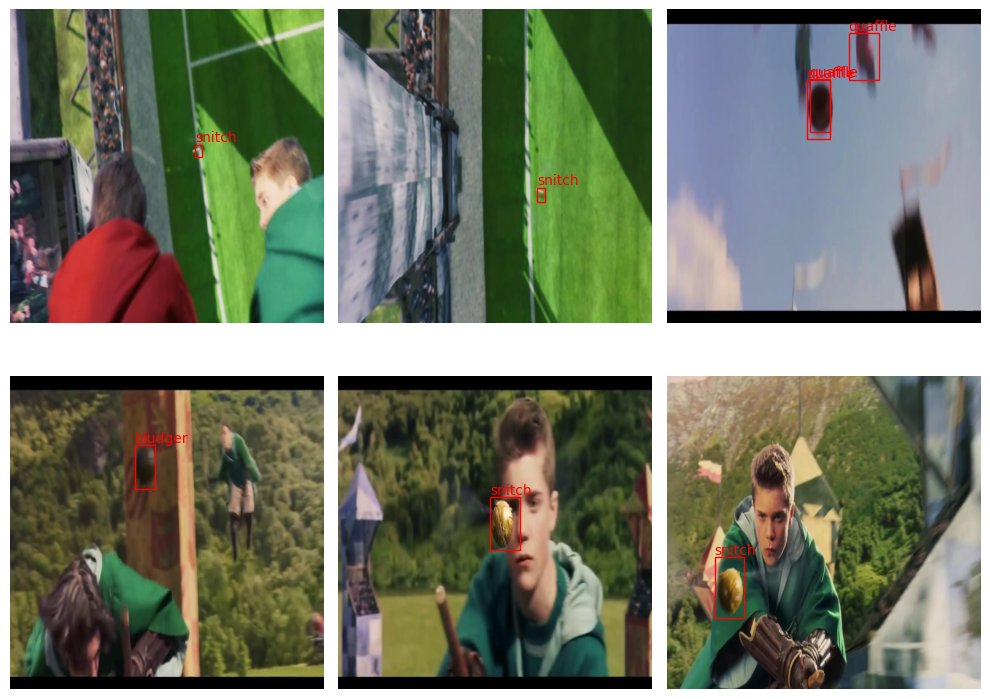

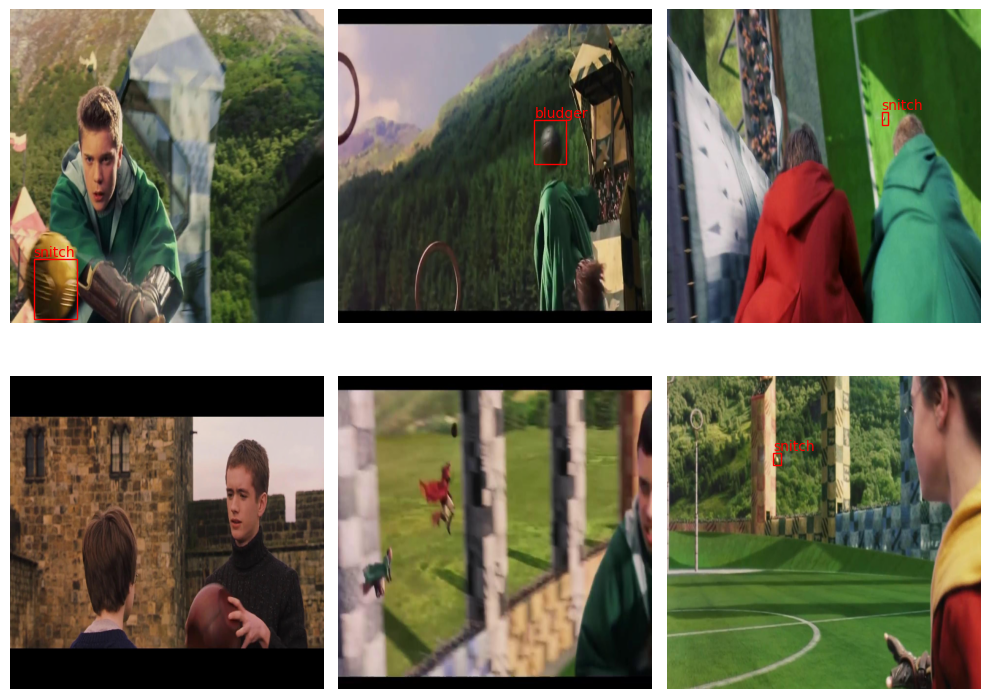

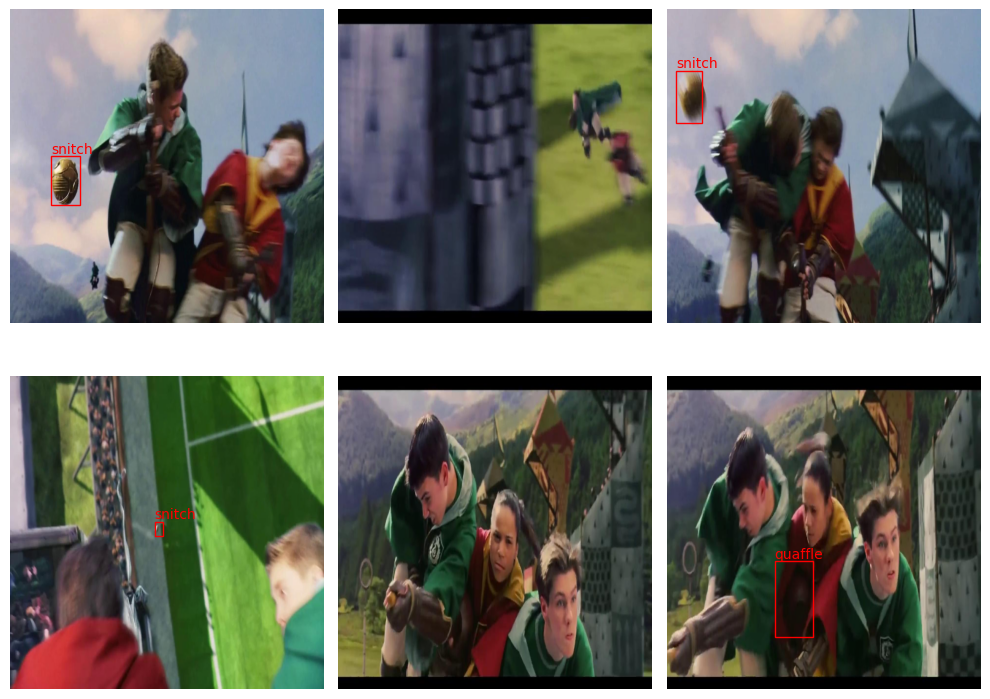

In [ ]:
# Нужно сделать предсказание и переложить результат на cpu
for _ in range(3):
    batch = next(i)
    images, targets = batch['image'].to(device), batch['target'].to(device)
    with torch.no_grad():
        model.eval()
        outputs = model(images)
    outputs_cpu = outputs.to('cpu')
    decode_prediction(outputs_cpu, threshold=0.6)
    visualize(images.cpu(), decode_prediction(outputs_cpu, threshold=0.1))

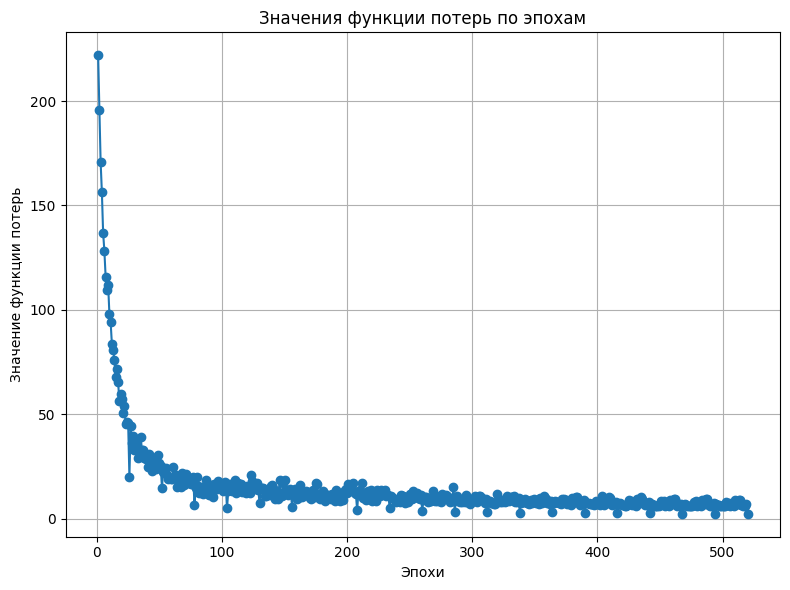

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', linestyle='-')

plt.title('Значения функции потерь по эпохам')
plt.xlabel('Эпохи')
plt.ylabel('Значение функции потерь')
plt.grid(True)
plt.tight_layout()

plt.show()

# Готовая архитектура

 YOLO v8 от ultralytics.

In [ ]:
!pip install ultralytics

In [ ]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

In [ ]:
def annotation2txt(bboxes, w_im, h_im):
    yolo_annotations = []

    for bbox in bboxes:
        x_min, y_min, x_max, y_max, class_idx = bbox
        x_center = (x_min + x_max) / 2 / w_im
        y_center = (y_min + y_max) / 2 / h_im
        width = (x_max - x_min) / w_im
        height = (y_max - y_min) / h_im
        yolo_annotations.append(f"{class_idx} {x_center} {y_center} {width} {height}")

    return yolo_annotations

In [ ]:
# Копируем картиночки по папочкам и создаем txt файлики

for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0], "./train/images/" + result[0].split("/")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0], "./valid/images/" + result[0].split("/")[-1],
    )

    with open(
        "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [ ]:
# Собираем YAML

nc =  3
names =  ['quaffle','bladger','snitch']

with open("data.yaml", "w") as f:
    f.write(f"train: ../train/images\nval: ../valid/images\n\nnc: {nc}\nnames: {names}")

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s.yaml')

results = model.train(
    task='detect',
   data='data.yaml',
   imgsz=512,
   epochs=100,
   batch=16,
   name='Davai_bustree'
)


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

100%|██████████| 755k/755k [00:00<00:00, 43.2MB/s]
2023-12-06 18:43:18,893	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2023-12-06 18:43:19,902	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 152MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/train/labels... 254 images, 0 backgrounds, 0 corrupt: 100%|██████████| 254/254 [00:00<00:00, 1176.73it/s]

train: New cache created: /kaggle/working/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/valid/labels... 29 images, 0 backgrounds, 1 corrupt: 100%|██████████| 29/29 [00:00<00:00, 836.59it/s]

val: WARNING ⚠️ /kaggle/working/valid/images/275.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1501]
val: New cache created: /kaggle/working/valid/labels.cache


Plotting labels to runs/detect/Davai_bustree/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 4 dataloader workers
Logging results to runs/detect/Davai_bustree
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.42G      5.024      9.389      4.185         28        512: 100%|██████████| 16/16 [00:05<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all         28         33   0.000477     0.0579   0.000538   6.44e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.53G      4.592       7.17      4.115         19        512: 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

                   all         28         33   0.000384     0.0208    0.00024    2.4e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.54G      4.421      7.242      3.925         23        512: 100%|██████████| 16/16 [00:03<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


                   all         28         33   0.000372     0.0208   0.000276   2.76e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.54G      3.875      6.002        3.6         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

                   all         28         33   0.000372     0.0208   0.000276   2.76e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.53G        3.5      5.347      3.181         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.92it/s]

                   all         28         33   0.000372     0.0208   0.000729   9.31e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.53G      3.044      4.791      2.703         29        512: 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.82it/s]

                   all         28         33   0.000179     0.0208   0.000267   2.67e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.55G      3.052      4.268      2.615         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28         33   0.000724     0.0949     0.0503     0.0151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.53G      2.789      4.152      2.565         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

                   all         28         33      0.976     0.0741     0.0756     0.0306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.53G      2.658      3.694      2.247         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]

                   all         28         33      0.912     0.0741     0.0828     0.0385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.52G      2.635      3.409      2.273         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]

                   all         28         33       0.64     0.0741      0.076     0.0379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.52G      2.602      3.183      2.172         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]

                   all         28         33      0.644     0.0741     0.0764     0.0426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.52G      2.475      2.964      2.097         33        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]

                   all         28         33      0.879     0.0741     0.0777     0.0331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.53G      2.452      3.007      2.087         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]

                   all         28         33      0.322     0.0741     0.0756     0.0546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.55G      2.502      2.982      2.085         19        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

                   all         28         33      0.649     0.0741     0.0756     0.0291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.53G      2.333      2.933      1.931         36        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]

                   all         28         33      0.987     0.0741     0.0764     0.0473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.52G      2.375      2.742      1.879         36        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]

                   all         28         33      0.303      0.116      0.081     0.0536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.52G      2.266      2.574      1.845         29        512: 100%|██████████| 16/16 [00:03<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]

                   all         28         33      0.971     0.0741     0.0791     0.0377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.53G      2.116      2.628        1.8         35        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

                   all         28         33      0.237     0.0741     0.0791     0.0505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.52G      2.048      2.388       1.74         24        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

                   all         28         33      0.161      0.105     0.0952     0.0589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.52G      2.215       2.26      1.745         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]

                   all         28         33      0.319     0.0741     0.0938     0.0536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.53G       2.14      2.231      1.678         40        512: 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]

                   all         28         33      0.308      0.111      0.117     0.0658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.55G      2.114      2.181      1.655         22        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]

                   all         28         33      0.974     0.0741     0.0897      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.53G      2.072      2.252      1.605         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.12it/s]

                   all         28         33      0.324     0.0741     0.0821      0.045



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.53G      1.983      2.163      1.629         24        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.89it/s]

                   all         28         33      0.662      0.111      0.131       0.07



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.55G      2.013      2.033      1.572         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

                   all         28         33      0.146      0.111     0.0948     0.0664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.53G      2.012      1.997      1.575         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

                   all         28         33      0.651     0.0741     0.0962     0.0594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.52G      1.907       1.96      1.518         36        512: 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]

                   all         28         33      0.197      0.111      0.131     0.0758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.55G      1.892      1.942      1.476         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.96it/s]

                   all         28         33      0.197      0.108      0.119     0.0731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.53G      1.959       1.98        1.6         34        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

                   all         28         33      0.252      0.148      0.158     0.0828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.53G      1.905      1.993      1.566         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all         28         33      0.986     0.0741       0.12     0.0829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.55G      1.855      1.817      1.439         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]

                   all         28         33      0.333      0.145      0.157     0.0957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.53G      1.846      1.756      1.538         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.06it/s]

                   all         28         33      0.266      0.169      0.162     0.0896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.52G      1.703      1.651      1.388         22        512: 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]

                   all         28         33        0.3      0.153      0.145     0.0862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.52G      1.753      1.598      1.378         25        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]

                   all         28         33      0.296      0.201      0.157       0.09



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.53G      1.714       1.61      1.371         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

                   all         28         33      0.311      0.227       0.19      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.52G      1.737      1.603       1.46         35        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]

                   all         28         33      0.322      0.226      0.206      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.52G      1.623      1.555      1.328         21        512: 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]

                   all         28         33      0.195      0.158      0.161     0.0954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.53G      1.575      1.454      1.315         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]

                   all         28         33      0.318      0.206      0.205      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.55G      1.682      1.575      1.375         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

                   all         28         33      0.384      0.217      0.206      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.53G      1.664      1.516      1.395         25        512: 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all         28         33      0.326      0.111      0.166      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.53G      1.603      1.435      1.366         22        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]

                   all         28         33      0.406      0.186      0.196     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.55G      1.644      1.525      1.397         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.96it/s]

                   all         28         33      0.284       0.19      0.188      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.53G      1.526      1.435      1.324         37        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

                   all         28         33      0.327      0.148      0.197     0.0995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.52G      1.593      1.458      1.337         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]

                   all         28         33      0.328      0.148      0.185      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.52G      1.608      1.408      1.282         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

                   all         28         33      0.292      0.227      0.211      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.53G      1.464      1.288      1.214         39        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.48it/s]

                   all         28         33      0.246      0.227      0.197      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.52G      1.516       1.34      1.278         23        512: 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.79it/s]

                   all         28         33      0.295      0.227      0.204       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.52G      1.537      1.346      1.287         20        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


                   all         28         33      0.465      0.224      0.229      0.125

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.53G      1.577      1.343       1.34         39        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

                   all         28         33      0.389      0.227      0.217      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.55G       1.53      1.331      1.292         24        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

                   all         28         33      0.441       0.19       0.21       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.53G      1.574      1.291      1.301         24        512: 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

                   all         28         33      0.329      0.227      0.199     0.0866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.53G      1.465      1.237      1.224         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]

                   all         28         33      0.417      0.227      0.221      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.55G      1.505      1.208      1.304         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

                   all         28         33      0.413      0.153      0.182      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.53G      1.519      1.302      1.332         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

                   all         28         33      0.259       0.19      0.191      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.52G      1.472      1.201      1.284         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


                   all         28         33      0.408      0.227      0.235       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.55G      1.486      1.281      1.262         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]

                   all         28         33      0.379      0.227      0.236      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.53G      1.475      1.214      1.263         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.59it/s]

                   all         28         33      0.364      0.227      0.241      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.53G      1.485      1.204        1.3         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

                   all         28         33      0.425      0.186      0.224      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.55G      1.459       1.15      1.217         24        512: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.45it/s]

                   all         28         33      0.334      0.225      0.225      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.53G       1.39      1.112      1.199         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]

                   all         28         33      0.393      0.227      0.236      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.52G      1.417      1.113      1.215         41        512: 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

                   all         28         33      0.391      0.227      0.248      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.55G      1.374      1.084      1.229         33        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

                   all         28         33      0.309      0.285      0.258      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.53G       1.36      1.094      1.181         21        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.74it/s]

                   all         28         33      0.254      0.301      0.247      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.53G      1.449      1.151      1.225         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

                   all         28         33       0.35      0.263      0.264      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.55G      1.388      1.096      1.174         28        512: 100%|██████████| 16/16 [00:03<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

                   all         28         33      0.333      0.181      0.226      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.53G      1.331     0.9834      1.167         24        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.44it/s]

                   all         28         33      0.278      0.285      0.254      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.52G      1.313      1.044      1.182         34        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.66it/s]

                   all         28         33      0.405      0.227      0.254      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.55G      1.251       0.96      1.134         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]

                   all         28         33      0.277      0.309      0.262      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.53G       1.28     0.9739      1.156         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

                   all         28         33      0.338      0.258      0.256      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.52G      1.322      1.006       1.15         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

                   all         28         33      0.387      0.222      0.254      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.55G      1.294      1.003      1.167         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.60it/s]

                   all         28         33      0.385      0.227       0.26      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.52G      1.291     0.9896      1.181         38        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]

                   all         28         33      0.386      0.264      0.256      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.53G      1.311     0.9779      1.174         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]

                   all         28         33      0.299       0.28      0.262      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.55G      1.363     0.9902      1.246         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]

                   all         28         33      0.309      0.301      0.286      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.53G      1.262     0.9338      1.165         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

                   all         28         33      0.287      0.219      0.244      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.52G      1.253      0.893      1.155         34        512: 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]

                   all         28         33        0.3      0.243      0.246      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.52G      1.232     0.8913      1.143         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

                   all         28         33      0.263       0.28      0.243      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.53G      1.285     0.9233      1.153         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

                   all         28         33      0.279      0.243      0.246      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.52G      1.236      0.892      1.122         39        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]

                   all         28         33      0.238      0.286       0.25      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.52G      1.206     0.8838      1.118         29        512: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.66it/s]

                   all         28         33      0.279      0.314      0.252      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.53G      1.251     0.8785      1.118         31        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all         28         33      0.232       0.28      0.246      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.55G      1.226     0.8568       1.14         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]

                   all         28         33      0.284      0.322       0.26      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.53G      1.179     0.8493      1.086         34        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]

                   all         28         33      0.388      0.261       0.26      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.53G      1.146     0.8257      1.065         25        512: 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

                   all         28         33      0.332      0.222      0.252      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.55G      1.178     0.8401      1.082         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.44it/s]

                   all         28         33      0.316      0.267      0.255      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.53G      1.186     0.8722      1.105         34        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]

                   all         28         33       0.31      0.322      0.253      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.52G      1.185     0.8285      1.118         37        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

                   all         28         33      0.291      0.322      0.251      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.55G      1.159     0.8427      1.089         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


                   all         28         33      0.251      0.322      0.242      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.53G      1.142     0.7692      1.098         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.80it/s]

                   all         28         33      0.287      0.308      0.254      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.53G      1.209     0.8361      1.089         24        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]

                   all         28         33      0.298      0.319      0.254      0.168


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.55G      1.233     0.9243       1.16         15        512: 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all         28         33      0.338      0.301      0.268      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.53G      1.162     0.8772      1.114         16        512: 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


                   all         28         33       0.32      0.322      0.264       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.52G      1.197     0.8592      1.118         14        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.93it/s]

                   all         28         33      0.317      0.322      0.266      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.52G      1.149     0.7886      1.106         16        512: 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

                   all         28         33      0.303      0.355      0.284       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.53G      1.117     0.8115      1.091         16        512: 100%|██████████| 16/16 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

                   all         28         33      0.287      0.285      0.275      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.52G      1.089     0.7586      1.075         18        512: 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


                   all         28         33      0.286      0.322      0.277      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.52G      1.127      0.794      1.079         15        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.80it/s]

                   all         28         33      0.297       0.33      0.282      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.53G      1.096     0.7862      1.075         13        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.63it/s]

                   all         28         33      0.315      0.359      0.286      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.55G      1.074      0.744      1.088         17        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]

                   all         28         33      0.327      0.356      0.286      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.53G      1.024     0.7236      1.049         17        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]

                   all         28         33      0.324      0.359      0.286      0.171



100 epochs completed in 0.133 hours.
Optimizer stripped from runs/detect/Davai_bustree/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/Davai_bustree/weights/best.pt, 22.5MB

Validating runs/detect/Davai_bustree/weights/best.pt...
Ultralytics YOLOv8.0.222 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
YOLOv8s summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


                   all         28         33      0.338      0.301      0.268      0.183
               quaffle         28          9      0.865      0.778      0.768      0.539
               bladger         28         16          0          0    0.00727    0.00388
                snitch         28          8      0.148      0.125     0.0272    0.00543
Speed: 0.1ms preprocess, 1.9ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/Davai_bustree


lr/pg0,▂▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▂▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▂▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▁▁▃▃▃▃▃▄▃▃▄▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█▇▇▇▇▇▇▇███
metrics/mAP50-95(B),▁▁▁▂▃▃▃▃▄▃▃▄▅▄▆▆▅▆▆▆▄▅▆▇▇▆▇▆▇▇▇▇██▇▇████
metrics/precision(B),▁▁▁█▆▃▃▃▃▃▆▂▃▃▃▄▄▃▃▄▃▃▄▃▄▄▄▃▄▃▃▃▃▃▃▃▃▃▃▃
metrics/recall(B),▂▁▁▂▂▂▃▂▃▂▂▃▄▅▅▅▄▄▅▅▅▅▅▅▅▆▅▆▆▇▆▇▇▅▇▇▇█▇▇
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▅▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁


In [ ]:
predictions = model.predict('/kaggle/working/valid/images', save=True)



image 1/29 /kaggle/working/valid/images/0.jpg: 256x512 1 bladger, 1 snitch, 67.3ms
image 2/29 /kaggle/working/valid/images/114.jpg: 256x512 (no detections), 6.9ms
image 3/29 /kaggle/working/valid/images/121.jpg: 256x512 1 snitch, 6.6ms
image 4/29 /kaggle/working/valid/images/127.jpg: 256x512 1 bladger, 1 snitch, 6.8ms
image 5/29 /kaggle/working/valid/images/144.jpg: 256x512 1 bladger, 7.1ms
image 6/29 /kaggle/working/valid/images/145.jpg: 256x512 1 bladger, 7.0ms
image 7/29 /kaggle/working/valid/images/152.jpg: 288x512 1 quaffle, 64.1ms
image 8/29 /kaggle/working/valid/images/157.jpg: 256x512 1 bladger, 7.4ms
image 9/29 /kaggle/working/valid/images/165.jpg: 256x512 (no detections), 6.9ms
image 10/29 /kaggle/working/valid/images/167.jpg: 288x512 1 quaffle, 7.5ms
image 11/29 /kaggle/working/valid/images/17.jpg: 288x512 1 quaffle, 7.0ms
image 12/29 /kaggle/working/valid/images/216.jpg: 256x512 (no detections), 7.4ms
image 13/29 /kaggle/working/valid/images/220.jpg: 288x512 1 snitch, 7.8m

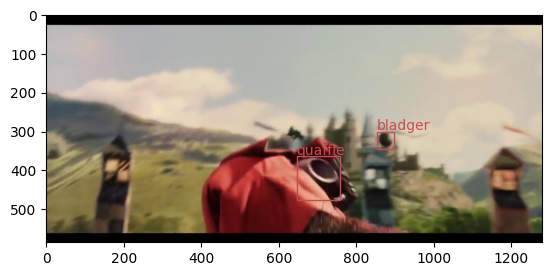

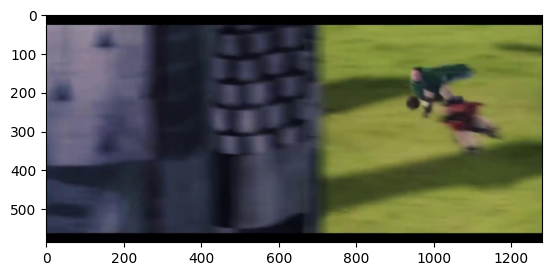

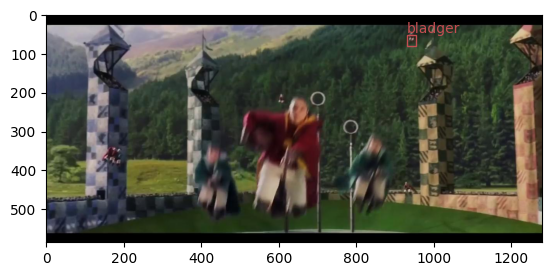

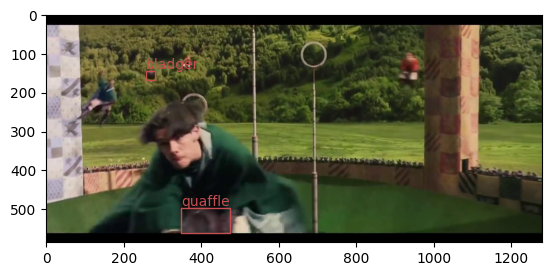

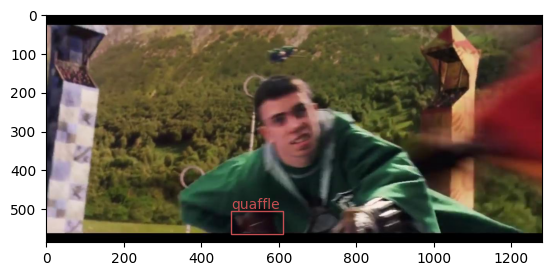

...

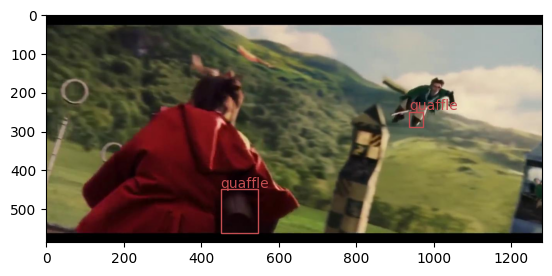

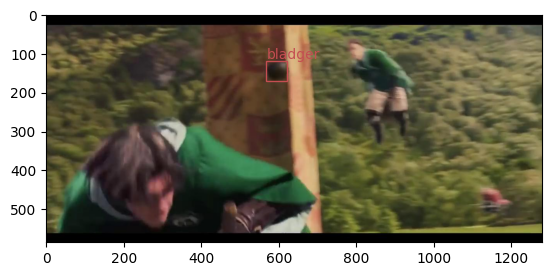

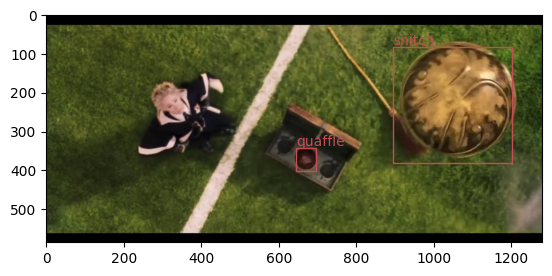

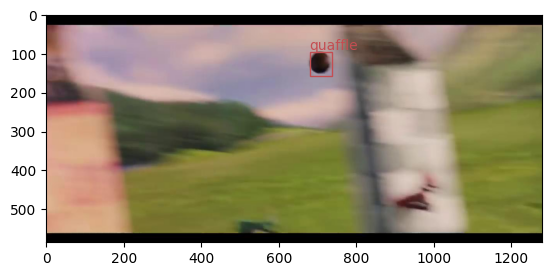

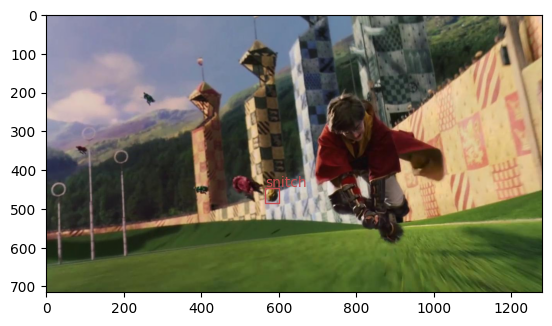

In [ ]:
class_dict_inv ={0.0:'snitch', 1.0:'quaffle',2.0:'bladger'}

for prediction in predictions:
    image_path = prediction.path
    boxes = prediction.boxes
    image = Image.open(image_path)
    plt.imshow(image)

    current_axis = plt.gca()
    for box in boxes:
        x, y, w, h = np.array(box.xywh[0].cpu())
        rectangle = Rectangle((x - w/2, y - h/2), w, h, edgecolor='r', facecolor='none')
        current_axis.add_patch(rectangle)
        current_axis.text(x - w/2, y - h/2 - 5, class_dict_inv[np.array(box.cls.cpu())[0]], color='r')

    plt.show()

https://wandb.ai/stepashkina-vita/YOLOv8/runs/lhd8oyhj?workspace=user-stepashkina-vita

https://wandb.ai/stepashkina-vita/YOLOv8/runs/lhd8oyhj